# Breast Cancer Detection via Ultrasound – Semantic Segmentation
**Maryam Baizhigitova**  
1st Place Project – Kaggle-style Competition  
Deep Learning | PyTorch | Medical Imaging | Multi-Class UNet  


### Dataset Downloading

In [ ]:
!pip install wldhx.yadisk-direct

In [ ]:
!curl -L $(yadisk-direct https://disk.yandex.ru/d/-4g-l44mqslQXg) -o data.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100  194M  100  194M    0     0  10.0M      0  0:00:19  0:00:19 --:--:-- 13.6M


In [ ]:
!unzip data.zip >> /dev/null

### Dataset Preparation

In [ ]:
import os
import glob
import cv2
import numpy as np
import torch
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import random

device = 'cuda' if torch.cuda.is_available() else 'cpu'


class MultiClassBUSIDataset(Dataset):
    def __init__(self, root_dir, image_size=(256, 256), transform=None, samples=None, include_normal=True, augment=False):
        """
        Multi-class BUSI dataset loader with augmentation.

        Args:
            root_dir (str): Path to dataset folder.
            image_size (tuple): Desired image size (H, W).
            transform (callable, optional): Additional torchvision transforms.
            samples (list, optional): Predefined list of (image_path, mask_path, class_id) tuples.
            include_normal (bool): Whether to include normal (background) cases.
            augment (bool): Apply augmentation to training data.
        """
        self.root_dir = root_dir
        self.image_size = image_size
        self.transform = transform
        self.include_normal = include_normal
        self.augment = augment  # Enable augmentation for training

        # Define class mappings
        self.class_to_idx = {'background': 0, 'benign': 1, 'malignant': 2}

        if samples is not None:
            self.samples = samples
        else:
            self.samples = self._scan_dataset()

        if not self.samples:
            raise ValueError("No valid image-mask pairs found in the dataset.")

        self.length = len(self.samples)

    def _scan_dataset(self):
        """Scans dataset directory for image-mask pairs."""
        samples = []
        subfolders = ["benign", "malignant", "normal"] if self.include_normal else ["benign", "malignant"]

        for sf in subfolders:
            folder_path = os.path.join(self.root_dir, sf)
            mask_paths = glob.glob(os.path.join(folder_path, "*_mask.png"))

            for mp in mask_paths:
                img_path = mp.replace("_mask", "")
                if os.path.exists(img_path):
                    class_id = {"normal": 0, "benign": 1, "malignant": 2}[sf]
                    samples.append((img_path, mp, class_id))

        return samples

    def __len__(self):
        return self.length

    def apply_augmentation(self, image, mask):
        """Apply the same augmentation to both image and mask."""
        # Convert to PIL
        image = Image.fromarray(image)
        mask = Image.fromarray(mask)

        # Random Horizontal Flip
        if random.random() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)

        # Random Vertical Flip
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask = TF.vflip(mask)

        # Random Rotation
        angle = random.uniform(-5, 5)
        image = TF.rotate(image, angle)
        mask = TF.rotate(mask, angle)

        return np.array(image), np.array(mask)

    def __getitem__(self, idx):
        img_path, mask_path, class_id = self.samples[idx]
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Resize
        image = cv2.resize(image, self.image_size, interpolation=cv2.INTER_AREA)
        mask = cv2.resize(mask, self.image_size, interpolation=cv2.INTER_NEAREST)

        # Normalize image
        image = image.astype(np.float32) / 255.0
        mask = (mask > 127).astype(np.uint8)

        # Convert to multi-class mask
        if class_id == 0:
            multi_class_mask = np.zeros_like(mask)
        else:
            multi_class_mask = mask * class_id

        # Apply augmentation
        if self.augment:
            image, multi_class_mask = self.apply_augmentation(image, multi_class_mask)

        # Convert to tensors
        image_tensor = torch.tensor(image, dtype=torch.float32).unsqueeze(0)  # Shape: [1, H, W]
        mask_tensor = torch.tensor(multi_class_mask, dtype=torch.long)  # Shape: [H, W]

        return image_tensor, mask_tensor

In [ ]:
def create_train_val_datasets(root_dir, val_ratio=0.2, image_size = (384, 384), include_normal=True, stratify=True):
    import os
    import glob
    import random
    from collections import defaultdict

    subfolders = ["benign", "malignant"] + (["normal"] if include_normal else [])
    all_samples = []
    samples_by_class = defaultdict(list)

    for sf in subfolders:
        folder_path = os.path.join(root_dir, sf)
        mask_paths = glob.glob(os.path.join(folder_path, "*_mask.png"))
        for mp in mask_paths:
            img_path = mp.replace("_mask", "")
            if os.path.exists(img_path):
                class_id = 0 if sf == "normal" else (1 if sf == "benign" else 2)
                sample = (img_path, mp, class_id)
                all_samples.append(sample)
                samples_by_class[class_id].append(sample)

    train_samples, val_samples = [], []
    max_class_size = 500  # per paper

    for class_id, samples in samples_by_class.items():
        random.shuffle(samples)
        val_count = int(len(samples) * val_ratio)
        val_samples.extend(samples[:val_count])
        train_pool = samples[val_count:]

        # Oversample for class balance
        while len(train_pool) < max_class_size:
            train_pool.append(random.choice(train_pool))
        train_samples.extend(train_pool)

        print(f"Class {class_id}: {len(samples)} total, {len(train_pool)} train, {val_count} validation")

    train_dataset = MultiClassBUSIDataset(
        root_dir,
        image_size=image_size,
        samples=train_samples,
        augment=True,                # Enable built-in augmentation
        include_normal=include_normal
    )

    val_dataset = MultiClassBUSIDataset(
        root_dir,
        image_size=image_size,
        samples=val_samples,
        augment=False,  # No augmentation for validation
        include_normal=include_normal
    )

    print(f"Total: {len(all_samples)} samples")
    print(f"Train: {len(train_samples)} samples")
    print(f"Validation: {len(val_samples)} samples")

    return train_dataset, val_dataset

### Creating the model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# -------------------------
# 1. Residual Convolutional Block
# -------------------------
class ResidualConvBlock(nn.Module):
    """
    A residual convolutional block that applies two convolutional layers with batch normalization,
    ReLU activations, and dropout. The block adds the input (after a possible channel adjustment)
    to the output (skip connection), helping with gradient flow in deeper networks.
    """
    def __init__(self, in_channels, out_channels, dropout=0.1):
        super(ResidualConvBlock, self).__init__()
        # First convolution: maintains spatial dimensions using padding.
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.relu  = nn.ReLU(inplace=True)

        # Second convolution: further processes the features.
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(out_channels)

        # Dropout to prevent overfitting.
        self.dropout = nn.Dropout2d(dropout)

        # If the number of input channels is different from output channels, adjust using 1x1 convolution.
        self.skip_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else None

    def forward(self, x):
        # Save the original input for the residual connection.
        identity = x if self.skip_conv is None else self.skip_conv(x)

        # First convolutional layer sequence: conv -> batch norm -> ReLU -> dropout.
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.dropout(out)

        # Second convolutional layer sequence: conv -> batch norm -> dropout.
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.dropout(out)

        # Add the skip connection and apply ReLU.
        out += identity
        out = self.relu(out)
        return out

# -------------------------
# 2. Attention Gate
# -------------------------
class AttentionGate(nn.Module):
    """
    The AttentionGate refines skip connection features by learning an attention mask.
    It uses a gating signal (from the decoder) and the encoder features to compute a mask,
    which is then applied element-wise to the encoder features.
    """
    def __init__(self, F_g, F_l, F_int):
        """
        Parameters:
            F_g: Number of channels in the gating signal from the decoder.
            F_l: Number of channels in the encoder's skip connection.
            F_int: Number of intermediate channels for internal computations.
        """
        super(AttentionGate, self).__init__()
        # Process the gating signal.
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        # Process the skip connection from the encoder.
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        # Generate the attention coefficients.
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        """
        Parameters:
            g: Gating signal from the decoder (upsampled feature map).
            x: Encoder feature map (skip connection).
        Returns:
            x multiplied element-wise by the attention mask.
        """
        # Transform both the gating signal and encoder features.
        g1 = self.W_g(g)
        x1 = self.W_x(x)

        # Combine and apply ReLU.
        psi = self.relu(g1 + x1)

        # Compute attention coefficients and apply sigmoid.
        psi = self.psi(psi)

        # Scale the encoder features with the attention coefficients.
        return x * psi

# -------------------------
# 3. Improved U-Net with Residual Blocks + Attention
# -------------------------
class ImprovedUNet(nn.Module):
    """
    This model implements an improved U-Net for segmentation that combines:
        - Residual Convolutional Blocks: To improve gradient flow and network depth.
        - Attention Gates: To refine skip connections and focus on relevant features.
    The encoder progressively downsamples the input, while the decoder upsamples and refines features
    using attention to combine with the corresponding encoder outputs.
    """
    def __init__(self, in_channels=1, out_channels=3, init_features=64, dropout=0.1):
        super(ImprovedUNet, self).__init__()
        features = init_features

        # -------------------------
        # Encoder: Contracting path
        # -------------------------
        self.encoder1 = ResidualConvBlock(in_channels, features, dropout)
        self.encoder2 = ResidualConvBlock(features, features * 2, dropout)
        self.encoder3 = ResidualConvBlock(features * 2, features * 4, dropout)
        self.encoder4 = ResidualConvBlock(features * 4, features * 8, dropout)

        # -------------------------
        # Bottleneck: Deepest layer capturing abstract features
        # -------------------------
        self.bottleneck = ResidualConvBlock(features * 8, features * 16, dropout)

        # -------------------------
        # Decoder: Expansive path with attention-enhanced skip connections
        # -------------------------
        # Stage 4: Decoder corresponding to encoder4
        self.upconv4 = nn.ConvTranspose2d(features * 16, features * 8, kernel_size=2, stride=2)
        self.att4    = AttentionGate(F_g=features * 8, F_l=features * 8, F_int=features * 4)
        self.decoder4 = ResidualConvBlock(features * 16, features * 8, dropout)

        # Stage 3: Decoder corresponding to encoder3
        self.upconv3 = nn.ConvTranspose2d(features * 8, features * 4, kernel_size=2, stride=2)
        self.att3    = AttentionGate(F_g=features * 4, F_l=features * 4, F_int=features * 2)
        self.decoder3 = ResidualConvBlock(features * 8, features * 4, dropout)

        # Stage 2: Decoder corresponding to encoder2
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, kernel_size=2, stride=2)
        self.att2    = AttentionGate(F_g=features * 2, F_l=features * 2, F_int=features)
        self.decoder2 = ResidualConvBlock(features * 4, features * 2, dropout)

        # Stage 1: Decoder corresponding to encoder1
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, kernel_size=2, stride=2)
        self.att1    = AttentionGate(F_g=features, F_l=features, F_int=features // 2)
        self.decoder1 = ResidualConvBlock(features * 2, features, dropout)

        # -------------------------
        # Final output layer: Projects features to the desired number of classes.
        # -------------------------
        self.final_layer = nn.Conv2d(features, out_channels, kernel_size=1)

    def forward(self, x):
        # -------------------------
        # Encoder forward pass
        # -------------------------
        # Stage 1: Initial convolutional block
        enc1 = self.encoder1(x)
        # Stage 2: Downsample using max pooling and apply second block
        enc2 = self.encoder2(F.max_pool2d(enc1, 2))
        # Stage 3: Further downsampling and block processing
        enc3 = self.encoder3(F.max_pool2d(enc2, 2))
        # Stage 4: Continue downsampling
        enc4 = self.encoder4(F.max_pool2d(enc3, 2))

        # -------------------------
        # Bottleneck
        # -------------------------
        bottleneck = self.bottleneck(F.max_pool2d(enc4, 2))

        # -------------------------
        # Decoder forward pass with attention-enhanced skip connections
        # -------------------------
        # Stage 4: Upsample the bottleneck features.
        dec4 = self.upconv4(bottleneck)
        # Apply attention gate to the corresponding encoder output (enc4)
        enc4_att = self.att4(g=dec4, x=enc4)
        # Concatenate upsampled features with attention-refined encoder features.
        dec4 = torch.cat((dec4, enc4_att), dim=1)
        # Process with a residual block.
        dec4 = self.decoder4(dec4)

        # Stage 3: Upsample and apply attention with encoder features from enc3.
        dec3 = self.upconv3(dec4)
        enc3_att = self.att3(g=dec3, x=enc3)
        dec3 = torch.cat((dec3, enc3_att), dim=1)
        dec3 = self.decoder3(dec3)

        # Stage 2: Upsample and apply attention with encoder features from enc2.
        dec2 = self.upconv2(dec3)
        enc2_att = self.att2(g=dec2, x=enc2)
        dec2 = torch.cat((dec2, enc2_att), dim=1)
        dec2 = self.decoder2(dec2)

        # Stage 1: Final upsampling and attention with encoder features from enc1.
        dec1 = self.upconv1(dec2)
        enc1_att = self.att1(g=dec1, x=enc1)
        dec1 = torch.cat((dec1, enc1_att), dim=1)
        dec1 = self.decoder1(dec1)

        # -------------------------
        # Final projection to output channels
        # -------------------------
        return self.final_layer(dec1)

# -------------------------
# 4. Tversky / Focal Tversky Loss Functions
# -------------------------
class TverskyLoss(nn.Module):
    """
    Tversky Loss is designed for multi-class segmentation, particularly addressing class imbalance.
    It modifies the traditional Dice loss by weighing false positives and false negatives differently.
    """
    def __init__(self, alpha=0.5, beta=0.5, smooth=1e-6):
        """
        Parameters:
            alpha: Weight for false positives.
            beta: Weight for false negatives.
            smooth: Smoothing constant to avoid division by zero.
        """
        super(TverskyLoss, self).__init__()
        self.alpha = alpha
        self.beta = beta
        self.smooth = smooth

    def forward(self, preds, targets):
        """
        Parameters:
            preds: Model predictions of shape (N, C, H, W).
            targets: Ground truth labels of shape (N, H, W) with integer class labels.
        Returns:
            Tversky loss value.
        """
        num_classes = preds.size(1)
        # Convert predictions to probabilities.
        preds_softmax = F.softmax(preds, dim=1)
        # Convert ground truth to one-hot encoding and adjust dimensions.
        targets_one_hot = F.one_hot(targets, num_classes=num_classes).permute(0, 3, 1, 2).float()

        # Sum over batch, height, and width.
        dims = (0, 2, 3)
        # Compute the intersection between predictions and ground truth.
        intersection = (preds_softmax * targets_one_hot).sum(dims)
        # Compute false positives.
        fps = (preds_softmax * (1 - targets_one_hot)).sum(dims)
        # Compute false negatives.
        fns = ((1 - preds_softmax) * targets_one_hot).sum(dims)

        # Calculate the Tversky index.
        tversky_index = (intersection + self.smooth) / (
            intersection + self.alpha * fps + self.beta * fns + self.smooth
        )
        # Return the Tversky loss.
        return 1 - tversky_index.mean()

class FocalTverskyLoss(nn.Module):
    """
    Focal Tversky Loss further emphasizes hard-to-classify examples by applying a focusing parameter
    (gamma) to the Tversky loss. This is especially useful when dealing with class imbalance.
    """
    def __init__(self, alpha=0.4, beta=0.6, gamma=1.5, smooth=1e-6):
        """
        Parameters:
            alpha: Weight for false positives.
            beta: Weight for false negatives.
            gamma: Focusing parameter to amplify the loss for misclassified examples.
            smooth: Smoothing constant to avoid division by zero.
        """
        super(FocalTverskyLoss, self).__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.smooth = smooth

    def forward(self, preds, targets):
        """
        Parameters:
            preds: Model predictions of shape (N, C, H, W).
            targets: Ground truth labels of shape (N, H, W) with integer class labels.
        Returns:
            Focal Tversky loss value.
        """
        num_classes = preds.size(1)
        # Convert predictions to probabilities.
        preds_softmax = F.softmax(preds, dim=1)
        # Convert ground truth to one-hot encoding.
        targets_one_hot = F.one_hot(targets, num_classes=num_classes).permute(0, 3, 1, 2).float()

        dims = (0, 2, 3)
        # Compute intersection, false positives, and false negatives.
        intersection = (preds_softmax * targets_one_hot).sum(dims)
        fps = (preds_softmax * (1 - targets_one_hot)).sum(dims)
        fns = ((1 - preds_softmax) * targets_one_hot).sum(dims)

        # Calculate Tversky index.
        tversky_index = (intersection + self.smooth) / (
            intersection + self.alpha * fps + self.beta * fns + self.smooth
        )
        # Apply the focal parameter to the loss.
        focal_tversky = (1 - tversky_index) ** self.gamma
        return focal_tversky.mean()

In [ ]:
# Updated call
train_dataset, val_dataset = create_train_val_datasets(
    root_dir='/content/content/kaggle_dataset_3/train',
    val_ratio=0.2,
    image_size=(256, 256),
    include_normal=True,
    stratify=True               # Ensures class distribution in val set
)

# Updated DataLoader
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)


Class 1: 355 total, 500 train, 71 validation
Class 2: 167 total, 500 train, 33 validation
Class 0: 102 total, 500 train, 20 validation
Total: 624 samples
Train: 1500 samples
Validation: 124 samples


### Training the model

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import wandb
import numpy as np
from torchvision.utils import make_grid
import random
from IPython.display import clear_output, display
import time

def train_multiclass_unet(model, train_loader, val_loader, num_epochs=10, learning_rate=1e-4,
                         class_weights=None, device=None, project_name="unet-segmentation",
                         experiment_name="unet-training", visualize_sample_ids=None,
                         use_wandb=True, display_freq=1, interactive=True):
    """
    Training function for multi-class UNet segmentation model with visualization

    Args:
        model: MultiClassUNet model
        train_loader: DataLoader for training data
        val_loader: DataLoader for validation data
        num_epochs: Number of training epochs
        learning_rate: Initial learning rate
        class_weights: Optional tensor of weights for each class to handle class imbalance
        device: Device to train on (cuda or cpu)
        project_name: Name for wandb project
        experiment_name: Name for this specific experiment run
        visualize_sample_ids: List of three sample indices to visualize (if None, random samples are chosen)
        use_wandb: Whether to use Weights & Biases logging (default: True)
        display_freq: How often to update the interactive plots in epochs (default: 1)
        interactive: Whether to display real-time plots in the notebook (default: True)
    """
    # Initialize device
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = model.to(device)

    # Initialize loss function, optimizer and scheduler
    criterion = FocalTverskyLoss(alpha=0.4, beta=0.6, gamma=1.5)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=100, eta_min=1e-6)


    # Initialize wandb if enabled
    if use_wandb:
        wandb.init(project=project_name, name=experiment_name, config={
            "learning_rate": learning_rate,
            "epochs": num_epochs,
            "batch_size": train_loader.batch_size,
            "optimizer": "Adam",
            "scheduler": "ReduceLROnPlateau",
            "weight_decay": 1e-5,
            "device": str(device),
            "class_weights": class_weights.cpu().numpy().tolist() if class_weights is not None else None
        })

    # Create a palette for visualization (background, benign, malignant)
    class_colors = torch.tensor([
        [0, 0, 0],       # Background - black
        [0, 180, 255],   # Benign - blue
        [255, 77, 77]    # Malignant - red
    ], dtype=torch.uint8)

    # Select visualization samples if not provided
    if visualize_sample_ids is None:
        # Get a deterministic subset of validation data for visualization
        val_dataset_size = len(val_loader.dataset)
        visualize_sample_ids = random.sample(range(val_dataset_size), 3)

    # Extract these samples for consistent visualization
    vis_samples = []
    for idx in visualize_sample_ids:
        # Get sample directly from dataset to avoid batch issues
        sample_data, sample_target = val_loader.dataset[idx]
        vis_samples.append((sample_data.unsqueeze(0), sample_target.unsqueeze(0)))

    # Set up interactive plotting if enabled
    if interactive:
        plt.ion()  # Turn on interactive mode
        # Create figure with 4 rows (metrics + 3 samples)
        live_fig, live_axs = plt.subplots(4, 3, figsize=(18, 16))
        live_fig.tight_layout(pad=3.0)

        # Configure metrics plots in top row
        live_axs[0, 0].set_title('Training & Validation Loss')
        live_axs[0, 0].set_xlabel('Epochs')
        live_axs[0, 0].set_ylabel('Loss')
        live_axs[0, 0].grid(True)

        live_axs[0, 1].set_title('Dice Coefficients')
        live_axs[0, 1].set_xlabel('Epochs')
        live_axs[0, 1].set_ylabel('Dice Score')
        live_axs[0, 1].grid(True)

        live_axs[0, 2].set_title('Learning Rate')
        live_axs[0, 2].set_xlabel('Epochs')
        live_axs[0, 2].set_ylabel('LR')
        live_axs[0, 2].grid(True)

    train_losses = []
    val_losses = []
    dice_scores = {
        "dice_bg": [],
        "dice_benign": [],
        "dice_malignant": []
    }
    lr_history = []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0

        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            # Only log to wandb, avoid printing to console which clutters the notebook
            if batch_idx % 10 == 0 and use_wandb:
                wandb.log({
                    "batch": batch_idx + epoch * len(train_loader),
                    "batch_loss": loss.item(),
                })

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # Validation phase
        model.eval()
        val_loss = 0
        val_metrics = {"dice_bg": 0, "dice_benign": 0, "dice_malignant": 0}

        with torch.no_grad():
            for data, target in val_loader:
                data = data.to(device)
                target = target.to(device)

                output = model(data)
                loss = criterion(output, target)
                val_loss += loss.item()

                preds = torch.argmax(output, dim=1)

                for class_idx, class_name in enumerate(['bg', 'benign', 'malignant']):
                    pred_class = (preds == class_idx).float()
                    target_class = (target == class_idx).float()
                    intersection = (pred_class * target_class).sum().item()
                    union = pred_class.sum().item() + target_class.sum().item()

                    if union > 0:
                        dice = (2 * intersection) / (union + 1e-7)
                        val_metrics[f"dice_{class_name}"] += dice

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        for metric in val_metrics:
            val_metrics[metric] /= len(val_loader)
            dice_scores[metric].append(val_metrics[metric])

        # Generate visualizations for wandb
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))

        for i, (sample_data, sample_target) in enumerate(vis_samples):
            sample_data = sample_data.to(device)
            sample_target = sample_target.to(device)

            # Get model prediction
            with torch.no_grad():
                sample_output = model(sample_data)
                sample_pred = torch.argmax(sample_output, dim=1)

            # Convert to colored segmentation maps
            def class_to_color(tensor):
                colored = torch.zeros((tensor.shape[0], 3, tensor.shape[1], tensor.shape[2]),
                                      dtype=torch.uint8)
                for cls_idx in range(3):  # 3 classes
                    mask = (tensor == cls_idx)
                    for channel in range(3):  # RGB
                        colored[:, channel][mask] = class_colors[cls_idx][channel]
                return colored

            # Create colored versions of ground truth and prediction
            colored_gt = class_to_color(sample_target)
            colored_pred = class_to_color(sample_pred)

            # Convert tensors to numpy for visualization
            img = sample_data[0].cpu().permute(1, 2, 0).numpy()

            # Normalize image for display
            if img.shape[2] == 1:  # Grayscale image
                img = np.repeat(img, 3, axis=2)

            img = (img - img.min()) / (img.max() - img.min() + 1e-8)

            gt = colored_gt[0].cpu().permute(1, 2, 0).numpy() / 255.0
            pred = colored_pred[0].cpu().permute(1, 2, 0).numpy() / 255.0

            # Plot in the figure
            axes[i, 0].imshow(img)
            axes[i, 0].set_title(f"Sample {visualize_sample_ids[i]}: Input")
            axes[i, 0].axis('off')

            axes[i, 1].imshow(gt)
            axes[i, 1].set_title(f"Sample {visualize_sample_ids[i]}: Ground Truth")
            axes[i, 1].axis('off')

            axes[i, 2].imshow(pred)
            axes[i, 2].set_title(f"Sample {visualize_sample_ids[i]}: Prediction")
            axes[i, 2].axis('off')

        plt.tight_layout()

        # Log to wandb
        if use_wandb:
            wandb.log({
                "epoch": epoch,
                "train_loss": train_loss,
                "val_loss": val_loss,
                "dice_bg": val_metrics["dice_bg"],
                "dice_benign": val_metrics["dice_benign"],
                "dice_malignant": val_metrics["dice_malignant"],
                "learning_rate": optimizer.param_groups[0]['lr'],
                "sample_predictions": wandb.Image(fig)
            })

        # Store learning rate history for plotting
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Update LR scheduler
        scheduler.step(val_loss)

        plt.close(fig)  # Close the figure to free memory

        # Update interactive plots if enabled
        if interactive and (epoch % display_freq == 0 or epoch == num_epochs - 1):
            # Clear previous output for cleaner display
            clear_output(wait=True)

            # Update loss plot
            live_axs[0, 0].clear()
            live_axs[0, 0].plot(range(len(train_losses)), train_losses, 'b-', label='Train Loss')
            live_axs[0, 0].plot(range(len(val_losses)), val_losses, 'r-', label='Val Loss')
            live_axs[0, 0].legend()
            live_axs[0, 0].set_title('Training & Validation Loss')
            live_axs[0, 0].set_xlabel('Epochs')
            live_axs[0, 0].set_ylabel('Loss')
            live_axs[0, 0].grid(True)

            # Update Dice coefficients plot
            live_axs[0, 1].clear()
            for dice_type, color, marker in zip(
                dice_scores.keys(),
                ['g-', 'b-', 'r-'],
                ['o', 's', '^']
            ):
                class_name = dice_type.split('_')[1]
                live_axs[0, 1].plot(
                    range(len(dice_scores[dice_type])),
                    dice_scores[dice_type],
                    color+marker,
                    label=f'Dice {class_name.capitalize()}'
                )
            live_axs[0, 1].legend()
            live_axs[0, 1].set_title('Dice Coefficients')
            live_axs[0, 1].set_xlabel('Epochs')
            live_axs[0, 1].set_ylabel('Dice Score')
            live_axs[0, 1].grid(True)

            # Update learning rate plot
            live_axs[0, 2].clear()
            live_axs[0, 2].plot(range(len(lr_history)), lr_history, 'g-o')
            live_axs[0, 2].set_title('Learning Rate')
            live_axs[0, 2].set_xlabel('Epochs')
            live_axs[0, 2].set_ylabel('Learning Rate')
            live_axs[0, 2].set_yscale('log')  # Log scale for better visualization
            live_axs[0, 2].grid(True)

            # Display all three samples with their predictions
            for i, (sample_data, sample_target) in enumerate(vis_samples):
                # Get prediction for the sample
                model.eval()
                with torch.no_grad():
                    sample_data = sample_data.to(device)
                    sample_output = model(sample_data)
                    sample_pred = torch.argmax(sample_output, dim=1)

                # Convert tensors to displayable images
                img = sample_data[0].cpu().permute(1, 2, 0).numpy()
                # Normalize image for display
                if img.shape[2] == 1:  # Grayscale image
                    img = np.repeat(img, 3, axis=2)
                img = (img - img.min()) / (img.max() - img.min() + 1e-8)

                # Create colored versions of ground truth and prediction
                def class_to_color(tensor):
                    colored = torch.zeros((tensor.shape[0], 3, tensor.shape[1], tensor.shape[2]),
                                        dtype=torch.uint8)
                    for cls_idx in range(3):  # 3 classes
                        mask = (tensor == cls_idx)
                        for channel in range(3):  # RGB
                            colored[:, channel][mask] = class_colors[cls_idx][channel]
                    return colored

                # Create colored versions
                colored_gt = class_to_color(sample_target)[0].cpu().permute(1, 2, 0).numpy() / 255.0
                colored_pred = class_to_color(sample_pred)[0].cpu().permute(1, 2, 0).numpy() / 255.0

                # Display input image - use row i+1 (rows 1,2,3 for the three samples)
                row_idx = i + 1  # First row is for metrics, so samples start at row 1

                live_axs[row_idx, 0].clear()
                live_axs[row_idx, 0].imshow(img)
                live_axs[row_idx, 0].set_title(f'Sample {visualize_sample_ids[i]}: Input')
                live_axs[row_idx, 0].axis('off')

                # Display ground truth
                live_axs[row_idx, 1].clear()
                live_axs[row_idx, 1].imshow(colored_gt)
                live_axs[row_idx, 1].set_title(f'Ground Truth')
                live_axs[row_idx, 1].axis('off')

                # Display prediction
                live_axs[row_idx, 2].clear()
                live_axs[row_idx, 2].imshow(colored_pred)
                live_axs[row_idx, 2].set_title(f'Prediction')
                live_axs[row_idx, 2].axis('off')

            # Show the updated figure
            live_fig.suptitle(f'Training Progress - Epoch {epoch}/{num_epochs}', fontsize=16)
            live_fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.95])  # Make room for suptitle
            display(live_fig)
            plt.pause(0.1)  # Small pause to update the display

    # Plot final training curves
    fig, axs = plt.subplots(2, 1, figsize=(10, 12))

    # Plot loss curves
    axs[0].plot(range(num_epochs), train_losses, label='Train Loss')
    axs[0].plot(range(num_epochs), val_losses, label='Val Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend()
    axs[0].set_title('Training and Validation Loss')
    axs[0].grid(True)

    # Plot Dice scores
    for dice_type in dice_scores:
        class_name = dice_type.split('_')[1]
        axs[1].plot(range(num_epochs), dice_scores[dice_type],
                   label=f'Dice {class_name.capitalize()}')

    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Dice Score')
    axs[1].legend()
    axs[1].set_title('Validation Dice Scores by Class')
    axs[1].grid(True)

    plt.tight_layout()
    if use_wandb:
        wandb.log({"final_metrics": wandb.Image(fig)})
    plt.close(fig)

    # Finish wandb run if enabled
    if use_wandb:
        wandb.finish()

    # Turn off interactive mode
    if interactive:
        plt.ioff()
        plt.close(live_fig)

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'dice_scores': dice_scores
    }

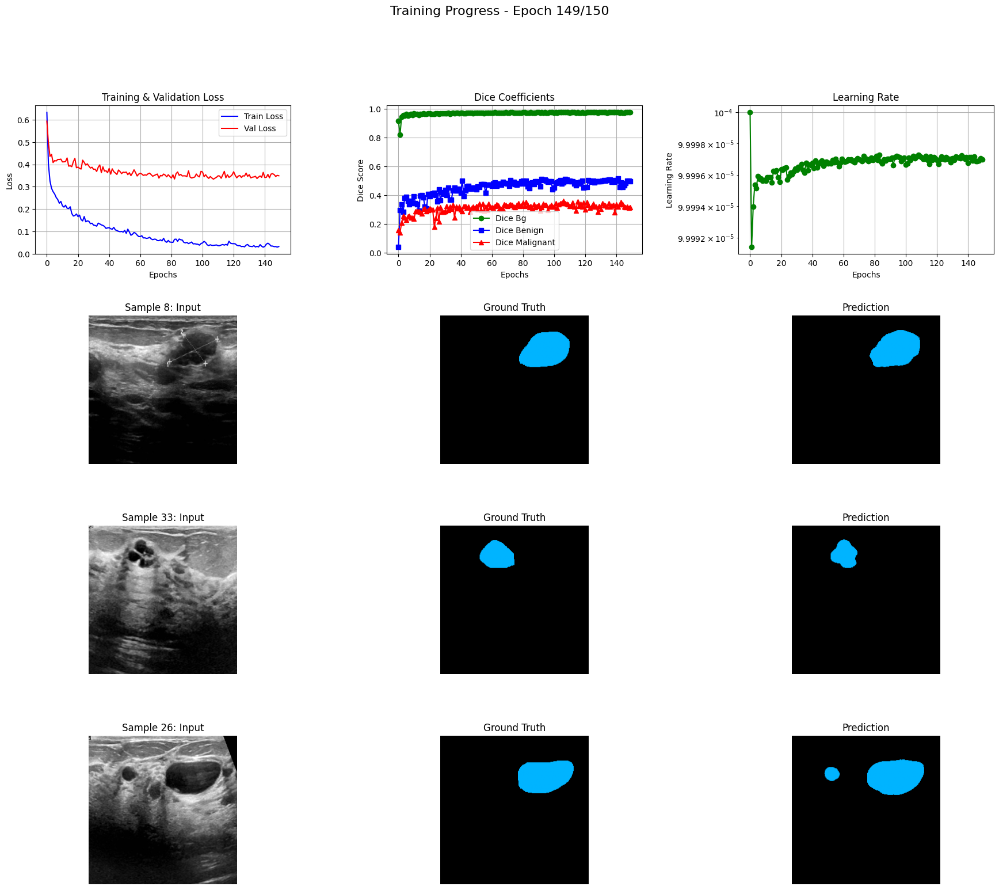

batch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█
batch_loss,█▅▃▄▄▃▂▂▂▂▂▂▂▄▂▂▁▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
dice_benign,▁▅▆▆▇▆▇▆▆▇▇█▇▇▇██████████▇██████▇█████▇█
dice_bg,▁▆▇▅▇▇▆▇▇▇▇▇████████████████████████████
dice_malignant,▁▅▄▆▆▆▆▂▄▆▆▄▆▇▇▇█▇▇▇█▇▆▇▇▇▇█▇█▆█▇▇▇▇▇▇▇▇
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇███
learning_rate,▁▃▃▄▅▄▅▅▄▆▇▅▅▆▆▆▆▇▆▇▇▇▇▇█▇▇▆▇▆▇▇▇█▆▇█▇█▇
train_loss,█▅▅▄▅▄▄▃▃▃▃▃▃▃▃▂▂▂▃▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▂▁▁▁▁
val_loss,█▇▅▇▆▄▄▅▅▄▅▄▃▃▃▃▂▃▂▃▃▃▄▂▂▂▂▃▂▁▁▂▂▂▂▂▃▃▂▂
batch,7043
batch_loss,0.01161


In [ ]:
model = ImprovedUNet(in_channels=1, out_channels=3, init_features=96)

training_history = train_multiclass_unet(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=150,
    learning_rate=1e-4
)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import os


def visualize_multiclass_prediction(model, data_loader, num_samples=4, save_dir=None):
    """
    Visualizes model predictions alongside input images and ground truth masks for multi-class segmentation.

    Args:
        model: The trained UNet model
        data_loader: DataLoader containing validation or test data
        num_samples: Number of samples to visualize
        save_dir: Directory to save the visualizations (if None, just displays them)
    """
    model.eval()

    colors = np.array([[0, 0, 0],       # Background - Black
                      [0, 0.7, 1],      # Benign - Blue
                      [1, 0.3, 0.3]])   # Malignant - Red

    segmentation_cmap = ListedColormap(colors)

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    samples_processed = 0

    with torch.no_grad():
        for images, masks in data_loader:
            images = images.to(device)
            masks = masks.to(device)

            logits = model(images)
            preds = torch.argmax(logits, dim=1)

            batch_size = images.shape[0]
            for i in range(batch_size):
                if samples_processed >= num_samples:
                    break

                img = images[i].detach().cpu().numpy().squeeze()
                mask = masks[i].detach().cpu().numpy()
                pred = preds[i].detach().cpu().numpy()

                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(img, cmap='gray')
                axes[0].set_title('Input Ultrasound')
                axes[0].axis('off')

                axes[1].imshow(mask, cmap=segmentation_cmap, vmin=0, vmax=2)
                axes[1].set_title('Ground Truth')
                axes[1].axis('off')

                axes[2].imshow(pred, cmap=segmentation_cmap, vmin=0, vmax=2)
                axes[2].set_title('Prediction')
                axes[2].axis('off')

                patches = [plt.Rectangle((0, 0), 1, 1, color=colors[i]) for i in range(3)]
                labels = ['Background', 'Benign', 'Malignant']
                fig.legend(patches, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.05))

                # Calculate class-wise Dice scores
                dice_scores = []
                for class_idx in range(3):
                    pred_class = (pred == class_idx).astype(np.float32)
                    mask_class = (mask == class_idx).astype(np.float32)

                    intersection = np.sum(pred_class * mask_class)
                    union = np.sum(pred_class) + np.sum(mask_class)

                    dice = (2. * intersection + 1e-7) / (union + 1e-7)
                    dice_scores.append(dice)

                fig.suptitle(f'Dice Scores - Background: {dice_scores[0]:.3f}, '
                            f'Benign: {dice_scores[1]:.3f}, Malignant: {dice_scores[2]:.3f}')

                plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Make room for legend

                if save_dir is not None:
                    plt.savefig(os.path.join(save_dir, f'sample_{samples_processed}.png'),
                                bbox_inches='tight', dpi=150)
                    plt.close()
                else:
                    plt.show()

                samples_processed += 1

            if samples_processed >= num_samples:
                break

In [ ]:
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True, num_workers=2) # shuffle to visualize different images

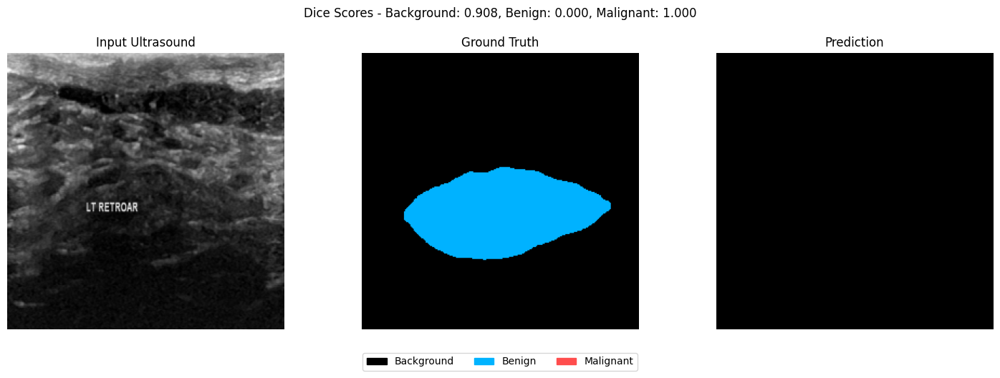

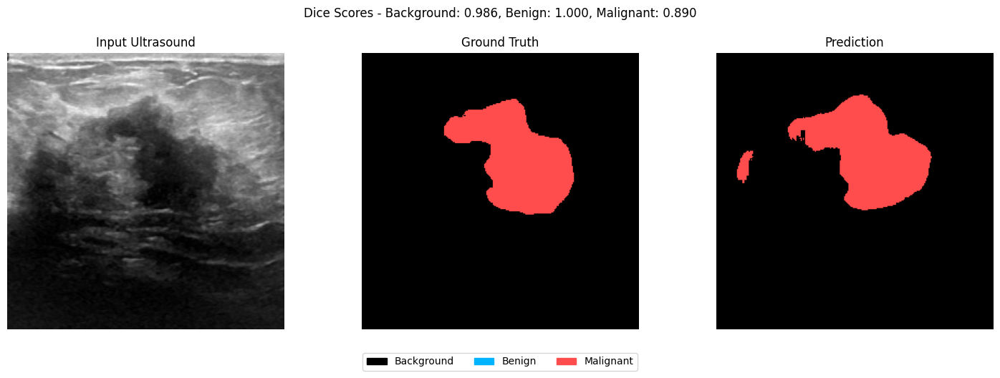

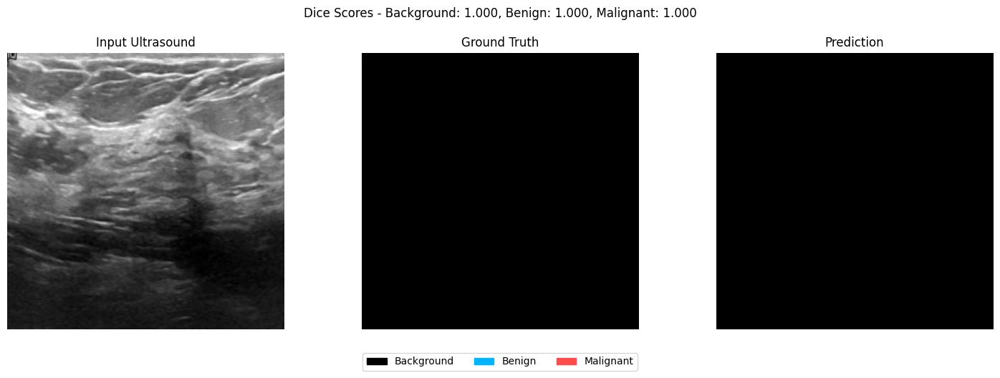

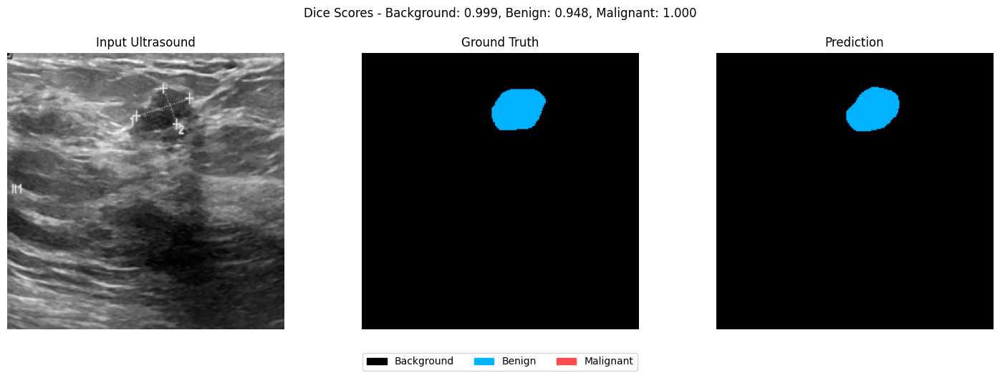

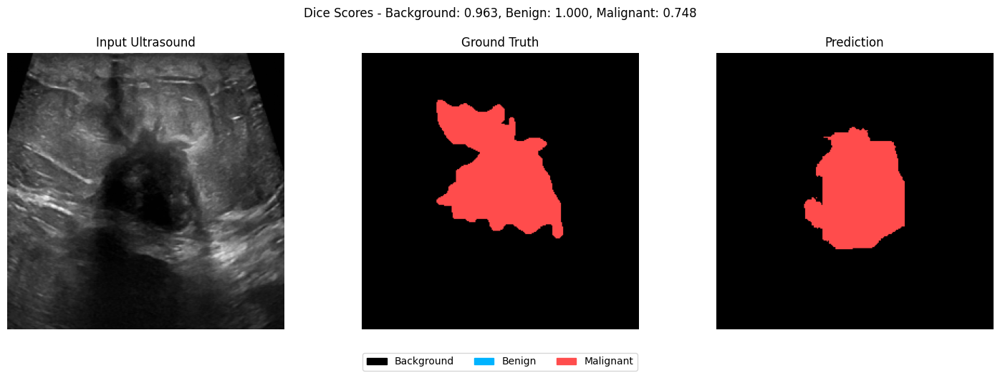

...

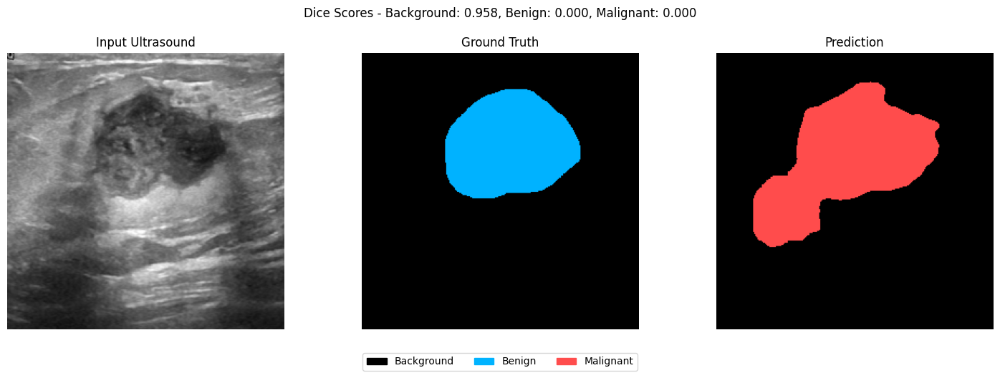

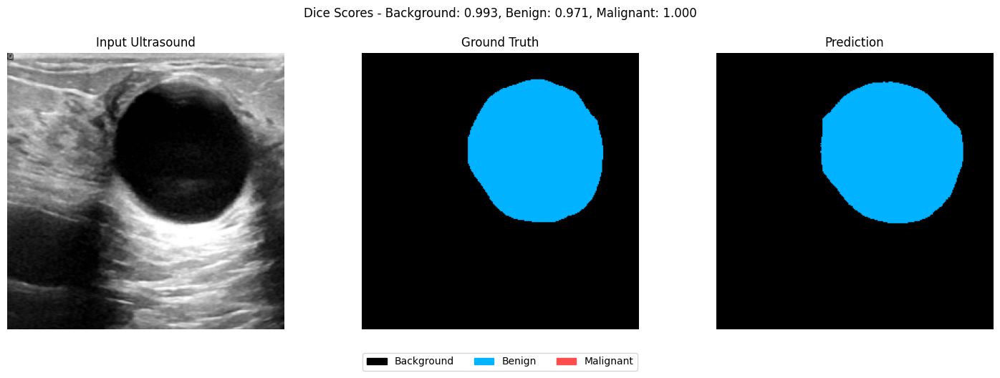

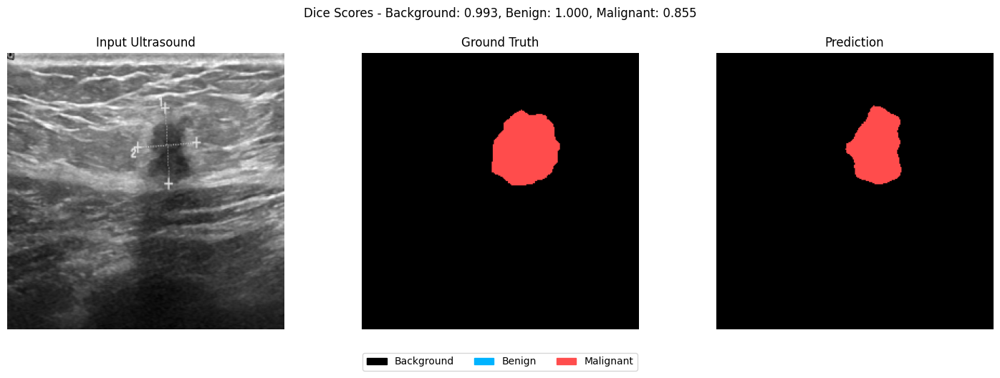

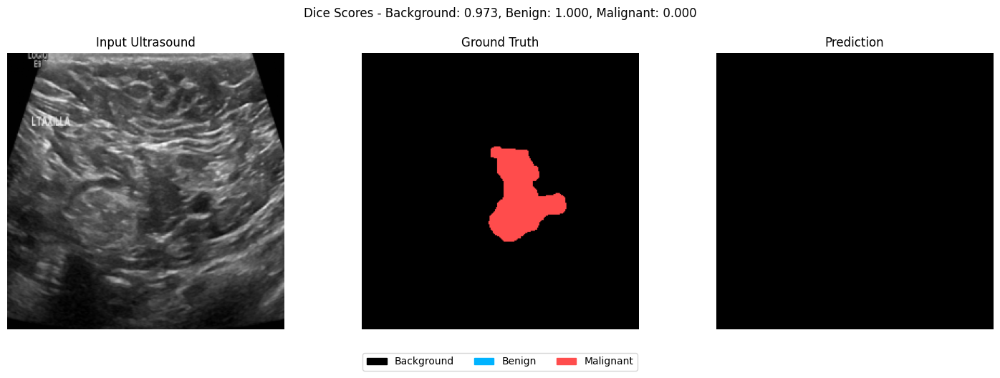

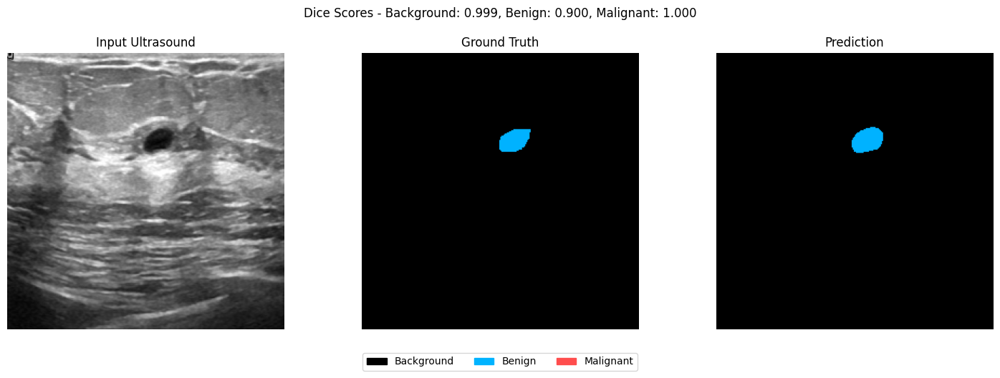

In [ ]:
visualize_multiclass_prediction(
    model, val_loader, num_samples=100
)

### Submission to Kaggle

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
import cv2
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import glob

class BUSITestDataset(Dataset):
    """Dataset for BUSI test images."""
    def __init__(self, test_dir, image_size=(256, 256)):
        self.test_dir = test_dir
        self.image_size = image_size

        # Get all image files
        self.image_files = [f for f in os.listdir(test_dir)
                          if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif'))]
        self.image_files.sort()  # Sort for consistent order

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_name = self.image_files[idx]
        image_path = os.path.join(self.test_dir, image_name)

        # Get image ID (filename without extension)
        image_id = os.path.splitext(image_name)[0]

        # Read image in original size
        original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        original_size = original_image.shape  # Store original size

        # Resize for model input
        image = cv2.resize(original_image, self.image_size, interpolation=cv2.INTER_AREA)

        # Normalize
        image = image.astype(np.float32) / 255.0

        # Convert to tensor
        image_tensor = torch.from_numpy(image).unsqueeze(0)  # Add channel dimension

        return {
            'image': image_tensor,
            'image_id': image_id,
            'original_h': original_size[0],  # Store original size for correct RLE encoding
            'original_w': original_size[1]
        }

def rle_encode_mask(mask):
    """Run-length encode a binary mask."""
    if np.sum(mask) == 0:
        return ''

    pixels = mask.flatten()
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs = np.concatenate([[0], runs])

    run_lengths = []
    for i in range(len(runs) - 1):
        if pixels[runs[i]] == 1:
            start = runs[i] + 1  # 1-indexed
            length = runs[i + 1] - runs[i]
            run_lengths.extend([start, length])

    return ' '.join(str(x) for x in run_lengths)

def combined_encode(masks_dict, delimiter="~"):
    """
    Encode multiple class masks into a single string.

    Args:
        masks_dict: Dictionary mapping class_id to binary mask
        delimiter: String to use as delimiter between class encodings

    Returns:
        Combined encoded string in format "class_id:rle~class_id:rle~..."
    """
    if not masks_dict:
        return ""

    encoded_parts = []

    for class_id, mask in masks_dict.items():
        rle = rle_encode_mask(mask)
        if rle:  # Only include non-empty masks
            encoded_parts.append(f"{class_id}:{rle}")

    return delimiter.join(encoded_parts)

def generate_submission(model, test_dir, output_file, batch_size=4, device=None, image_size=(256, 256)):
    """
    Generate a submission file from model predictions on test images.

    Args:
        model: Trained PyTorch model
        test_dir: Directory containing test images
        output_file: Path to save the submission CSV
        batch_size: Batch size for inference
        device: Device to run inference on
        image_size: Size to resize images to
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Create test dataset and loader
    test_dataset = BUSITestDataset(test_dir, image_size=image_size)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Move model to device and set to evaluation mode
    model.to(device)
    model.eval()

    # Results dictionary
    results = {
        'ID': [],
        'encoded_pixels': []
    }

    # Process each batch
    print("Generating predictions...")
    with torch.no_grad():
        for batch in tqdm(test_loader):
            images = batch['image'].to(device)
            image_ids = batch['image_id']
            original_hs = batch['original_h']  # [B, 2] tensor with original H, W
            original_ws = batch['original_w']  # [B, 2] tensor with original H, W

            # Forward pass
            outputs = model(images)

            # Process predictions
            batch_size = images.shape[0]

            # For multi-class segmentation (assuming outputs have shape [B, C, H, W])
            is_multiclass = outputs.shape[1] > 1

            if is_multiclass:
                # Get class predictions for each pixel
                predictions = torch.argmax(outputs, dim=1).cpu().numpy()  # [B, H, W]

                for i in range(batch_size):
                    image_id = image_ids[i]
                    pred = predictions[i]  # [H, W]
                    orig_h, orig_w = original_hs[i].item(), original_ws[i].item()

                    # Resize prediction back to original image size before RLE encoding
                    # CRITICAL: Use nearest neighbor interpolation for masks
                    pred_resized = cv2.resize(
                        pred.astype(np.float32),
                        (orig_w, orig_h),
                        interpolation=cv2.INTER_NEAREST
                    ).astype(np.int32)

                    # Create mask dictionary for this image
                    masks_dict = {}
                    for class_id in range(1, outputs.shape[1]):
                        # Create binary mask for this class using the RESIZED prediction
                        binary_mask = (pred_resized == class_id).astype(np.uint8)

                        # Only add non-empty masks
                        if np.sum(binary_mask) > 0:
                            masks_dict[class_id] = binary_mask

                    # Encode masks (will return empty string if no masks)
                    encoded_pixels = combined_encode(masks_dict)

                    # Add to results (even if encoded_pixels is empty)
                    results['ID'].append(image_id)
                    results['encoded_pixels'].append(encoded_pixels)

            else:
                # Binary segmentation - apply sigmoid and threshold
                predictions = torch.sigmoid(outputs).cpu().numpy() > 0.5

                for i in range(batch_size):
                    image_id = image_ids[i]
                    pred = predictions[i, 0]  # [H, W]
                    orig_h, orig_w = original_sizes[i]

                    # Resize prediction back to original image size
                    pred_resized = cv2.resize(
                        pred.astype(np.float32),
                        (orig_w, orig_h),
                        interpolation=cv2.INTER_NEAREST
                    ).astype(np.uint8)

                    # Create mask dictionary for classes 1 and 2
                    masks_dict = {}
                    for class_id in [1, 2]:  # Both benign and malignant
                        binary_mask = pred_resized.astype(np.uint8)

                        # Only add non-empty masks
                        if np.sum(binary_mask) > 0:
                            masks_dict[class_id] = binary_mask

                    # Encode masks (will return empty string if no masks)
                    encoded_pixels = combined_encode(masks_dict)

                    # Add to results (even if encoded_pixels is empty)
                    results['ID'].append(image_id)
                    results['encoded_pixels'].append(encoded_pixels)

    # Create DataFrame
    submission_df = pd.DataFrame(results)

    # Make sure there are no NULL/None values - replace with empty strings
    submission_df['encoded_pixels'] = submission_df['encoded_pixels'].fillna('')
    submission_df.loc[submission_df['encoded_pixels'] == '', 'encoded_pixels'] = '<empty>'

    # Sort by image_id for consistency
    submission_df = submission_df.sort_values('ID')

    # Save to CSV
    submission_df.to_csv(output_file, index=False)
    print(f"Submission saved to {output_file}")
    print(f"Total entries: {len(submission_df)}")
    print(f"Empty predictions: {(submission_df['encoded_pixels'] == '<empty>').sum()}")

    # Validate submission
    if submission_df.isnull().any().any():
        print("WARNING: Submission contains NULL values!")
    else:
        print("Validation passed: No NULL values in submission.")

    return submission_df

In [ ]:
generate_submission(
    model=model,
    test_dir='/content/content/kaggle_dataset_3/test',
    output_file='22_mb_fin_batch32.csv',
    batch_size=16,
    device=device
)

Generating predictions...


100%|██████████| 10/10 [00:02<00:00,  4.84it/s]

Submission saved to 22_mb_fin_batch32.csv
Total entries: 156
Empty predictions: 50
Validation passed: No NULL values in submission.


,ID,encoded_pixels
0,image_000,2:125662 32 126340 32 127015 37 127693 37 1283...
1,image_001,<empty>
2,image_002,<empty>
3,image_003,1:42187 27 42876 27 43565 27 44237 52 44926 52...
4,image_004,1:172483 42 172528 3 172534 3 173255 42 173300...
...,...,...
151,image_151,2:89688 29 90444 29 91194 41 91950 41 92706 47...
152,image_152,1:35890 16 36241 27 36594 33 36950 37 37307 37...
153,image_153,1:143904 48 144667 48 145425 59 146188 59 1469...
154,image_154,2:120944 3 121727 3 122492 64 123275 64 124058...


# Cross-validation part

In [ ]:
from sklearn.model_selection import KFold
from torch.utils.data import Subset, DataLoader
import numpy as np

def cross_validate_unet(dataset, model_fn, num_folds=5, batch_size=32, num_epochs=10, device=None):
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    val_losses_all = []
    dice_scores_all = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"\nFold {fold + 1}/{num_folds}")

        train_subset = Subset(dataset, train_idx)
        val_subset = Subset(dataset, val_idx)

        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

        model = model_fn()

        history = train_multiclass_unet(
            model=model,
            train_loader=train_loader,
            val_loader=val_loader,
            num_epochs=num_epochs,
            learning_rate=1e-4,
            use_wandb=False,  # Disable wandb inside cross-validation
            interactive=False,
            display_freq=1
        )

        val_losses_all.append(history['val_losses'][-1])
        final_dice = {
            'dice_bg': history['dice_scores']['dice_bg'][-1],
            'dice_benign': history['dice_scores']['dice_benign'][-1],
            'dice_malignant': history['dice_scores']['dice_malignant'][-1]
        }
        dice_scores_all.append(final_dice)

    return val_losses_all, dice_scores_all

# Example usage:
val_losses, dice_scores = cross_validate_unet(
    dataset=train_dataset + val_dataset,
    model_fn=lambda: ImprovedUNet(in_channels=1, out_channels=3, init_features=96),
    num_folds=5,
    batch_size=32,
    num_epochs=20,
    device=device
)

print("\nAverage validation loss:", np.mean(val_losses))
for cls in ['dice_bg', 'dice_benign', 'dice_malignant']:
    avg_score = np.mean([d[cls] for d in dice_scores])
    print(f"Average {cls}: {avg_score:.4f}")


Fold 1/5


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



Fold 2/5

Fold 3/5

Fold 4/5

Fold 5/5

Average validation loss: 0.44704584113576196
Average dice_bg: 0.9715
Average dice_benign: 0.2372
Average dice_malignant: 0.3072


In [ ]:
def compute_pixel_class_weights(dataset, num_classes=3):
    import numpy as np
    pixel_counts = np.zeros(num_classes)

    for _, mask in dataset:
        mask_np = mask.numpy()
        for cls in range(num_classes):
            pixel_counts[cls] += np.sum(mask_np == cls)

    total_pixels = np.sum(pixel_counts)
    class_weights = total_pixels / (num_classes * pixel_counts + 1e-6)  # Inverse freq

    # Normalize to sum to 1
    class_weights /= class_weights.sum()

    return class_weights

In [ ]:
# Compute normalized pixel-based class weights
pixel_class_weights = compute_pixel_class_weights(train_dataset + val_dataset)
print("Computed class weights (for Dice or loss):", pixel_class_weights)

Computed class weights (for Dice or loss): [0.01572956 0.66479562 0.31947482]


In [ ]:
# Average Dice scores across folds (from your output)
avg_dice = {
    'dice_bg': 0.9715,
    'dice_benign': 0.2372,
    'dice_malignant': 0.3072
}

# Define class weights (adjust based on dataset imbalance or importance)
# Example: Give more weight to malignant cases
weight_dict = {
    'dice_bg': pixel_class_weights[0],
    'dice_benign': pixel_class_weights[1],
    'dice_malignant': pixel_class_weights[2]
}

# Compute weighted mean Dice
weighted_mean_dice = sum(avg_dice[cls] * weight_dict[cls] for cls in avg_dice)

print(f"Weighted Mean Dice Coefficient: {weighted_mean_dice:.4f}")

Weighted Mean Dice Coefficient: 0.2711
